<a href="https://colab.research.google.com/github/alinecdet/csc725/blob/main/Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Histogram based segmentation**

Peak 1: 13
Object: Background
Peak 2: 17
Object: Background
Peak 3: 28
Object: Background
Peak 4: 32
Object: Background
Peak 5: 36
Object: Background
Peak 6: 45
Object: Background
Peak 7: 59
Object: Foreground
Peak 8: 61
Object: Foreground
Peak 9: 67
Object: Foreground
Peak 10: 71
Object: Foreground
Peak 11: 73
Object: Foreground
Peak 12: 78
Object: Foreground
Peak 13: 80
Object: Foreground
Peak 14: 83
Object: Foreground
Peak 15: 85
Object: Foreground
Peak 16: 88
Object: Foreground
Peak 17: 92
Object: Foreground
Peak 18: 95
Object: Foreground
Peak 19: 103
Object: Middleground
Peak 20: 109
Object: Middleground
Peak 21: 111
Object: Middleground
Peak 22: 115
Object: Middleground
Peak 23: 117
Object: Middleground
Peak 24: 120
Object: Middleground
Peak 25: 130
Object: Middleground
Peak 26: 133
Object: Middleground
Peak 27: 135
Object: Middleground
Peak 28: 137
Object: Middleground
Peak 29: 147
Object: Middleground
Peak 30: 150
Object: Highlight
Peak 31: 154
Object: Highlight
Peak 32: 156
Ob

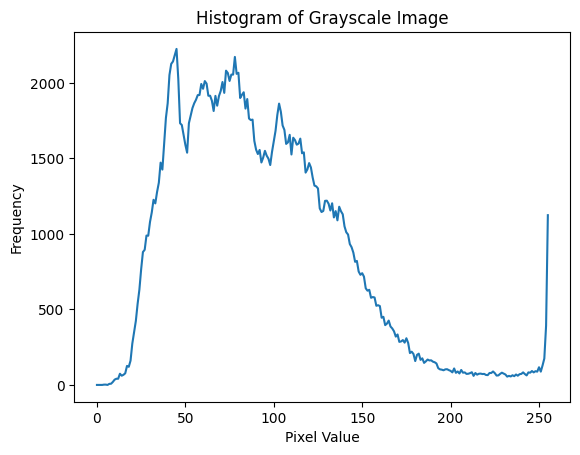

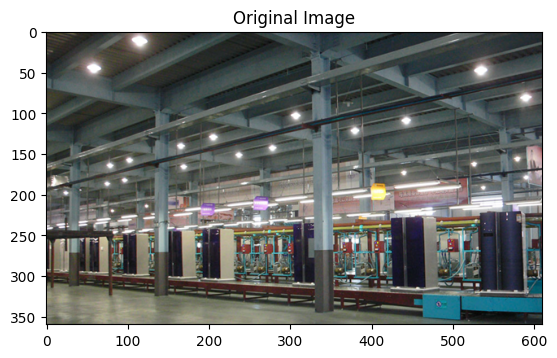

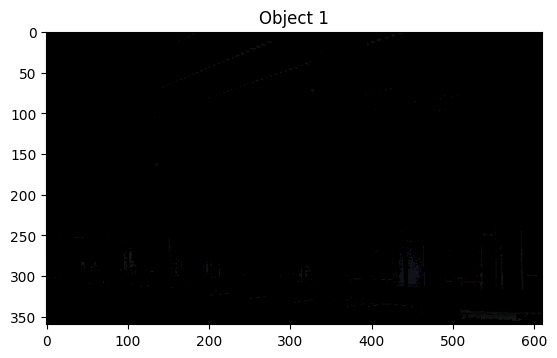

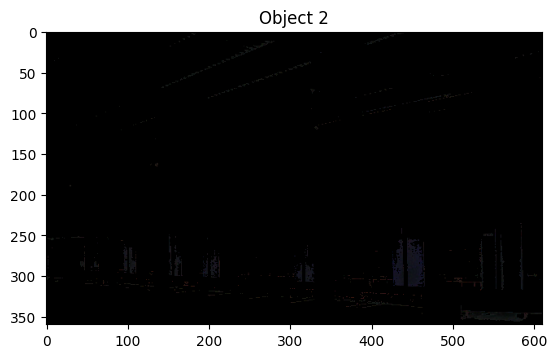

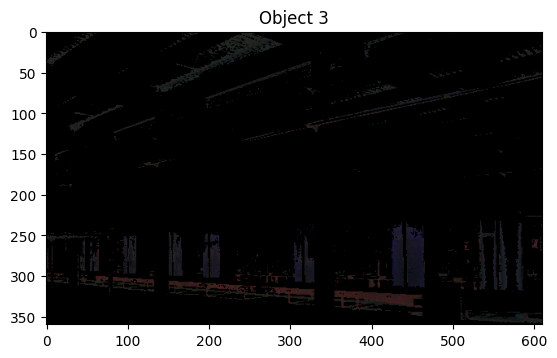

...

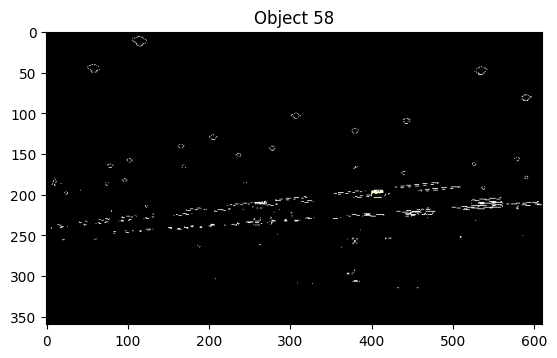

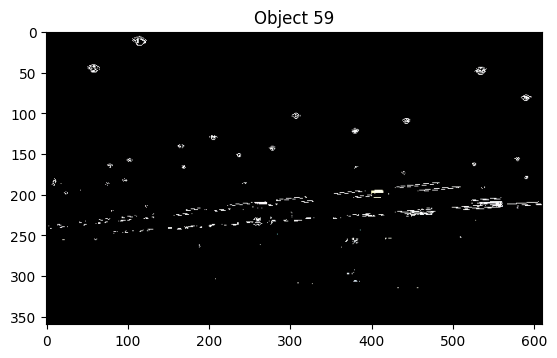

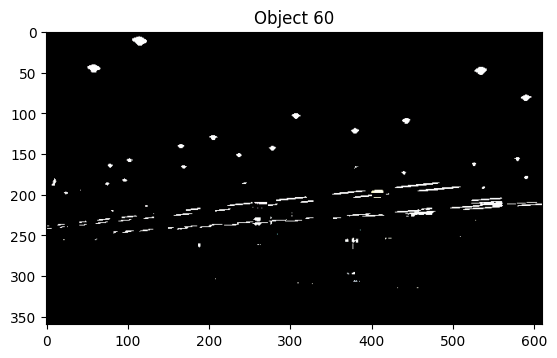

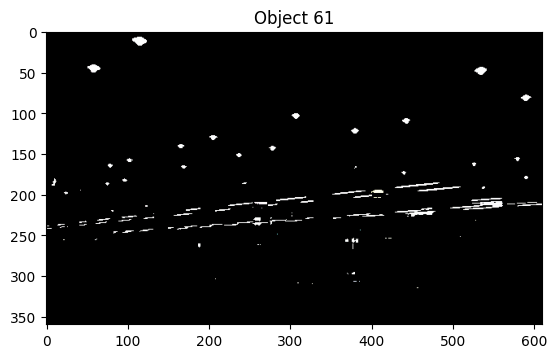

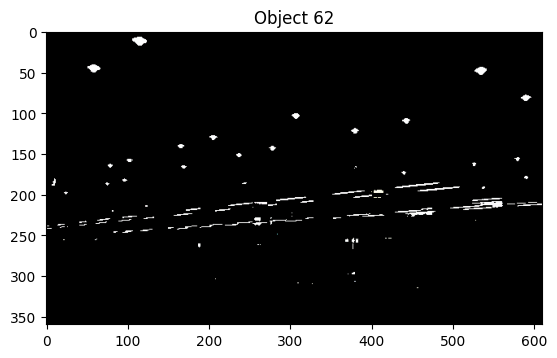

In [52]:
#Ali Necdet Guvercin

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/content/Production-Line-Ref.jpg')

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Calculate the histogram of the grayscale image
hist = cv2.calcHist([gray], [0], None, [256], [0, 256])

# Find the peaks of the histogram
peaks = []
for i in range(1, len(hist) - 1):
    if hist[i] > hist[i - 1] and hist[i] > hist[i + 1]:
        peaks.append(i)

# Print the peaks and their corresponding objects
for i, peak in enumerate(peaks):
    print(f"Peak {i + 1}: {peak}")
    if peak < 50:
        print("Object: Background")
    elif peak < 100:
        print("Object: Foreground")
    elif peak < 150:
        print("Object: Middleground")
    else:
        print("Object: Highlight")

# Plot the histogram
plt.plot(hist)
plt.title('Histogram of Grayscale Image')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

# Display the image and the identified objects
plt.imshow(image)
plt.title('Original Image')
plt.show()

for i, peak in enumerate(peaks):
    mask = cv2.inRange(gray, peak - 10, peak + 10)
    masked_image = cv2.bitwise_and(image, image, mask=mask)
    plt.imshow(masked_image)
    plt.title(f'Object {i + 1}')
    plt.show()




**Global bi-level thresholding**

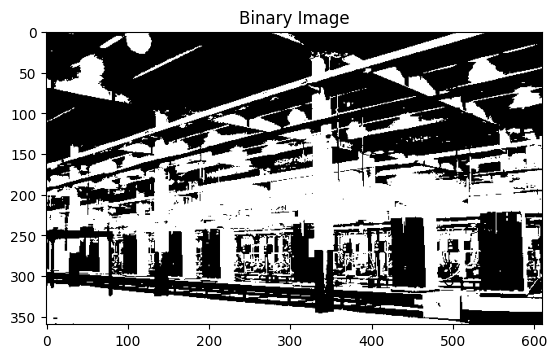

In [53]:
# prompt: implement a global bi-level thresholding algorithm to a given image and print it

# Calculate the mean of the grayscale image
mean = np.mean(gray)

# Set the threshold value to the mean
threshold = mean

# Apply the threshold to the image
binary_image = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)[1]

# Print the binary image
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image')
plt.show()


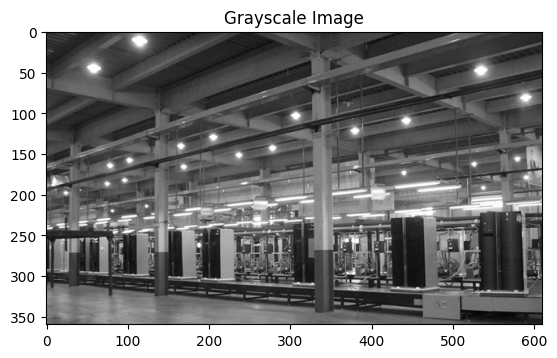

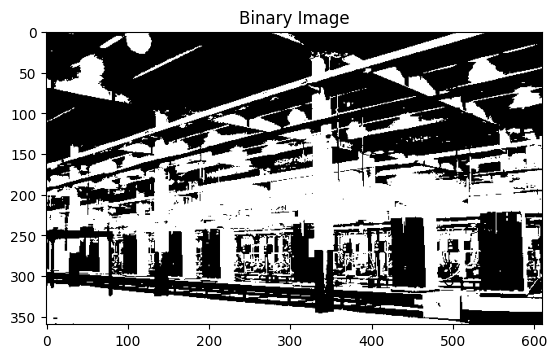

In [55]:
# prompt: print the gray of a given image and implement a global bi-level thresholding algorithm to a given image and print it

# Print the gray of a given image
plt.imshow(gray, cmap='gray')
plt.title('Grayscale Image')
plt.show()

# Implement a global bi-level thresholding algorithm to a given image and print it
# Calculate the mean of the grayscale image
mean = np.mean(gray)

# Set the threshold value to the mean
threshold = mean

# Apply the threshold to the image
binary_image = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)[1]

# Print the binary image
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image')
plt.show()


**iterative global threshold**

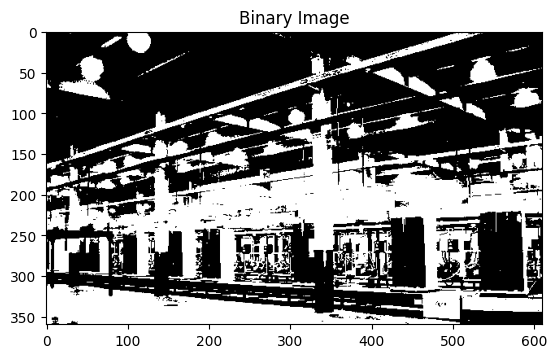

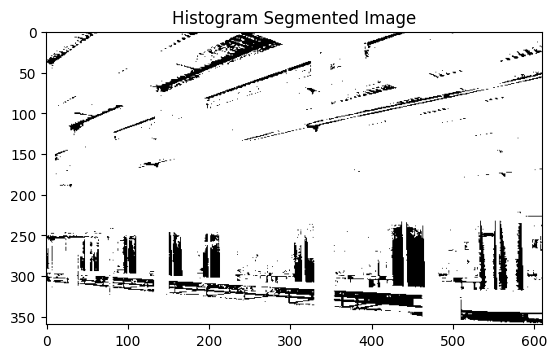

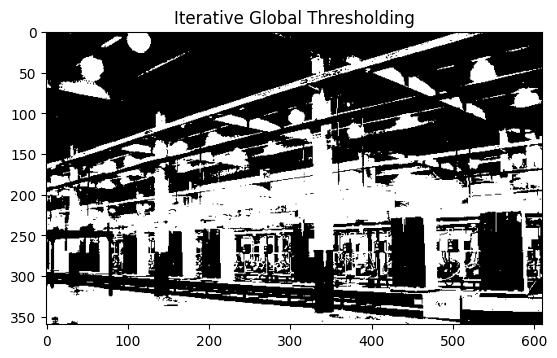

NameError: name 'binary_image_hist' is not defined

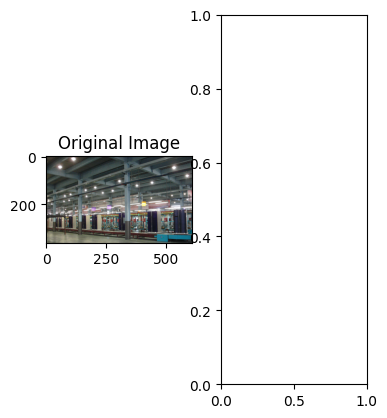

In [57]:
# prompt: implement a iterative global thresholding algorithm to a given image and print it with 3 major modes, original, histogram seg (0.85), IGT (0.85)

# Calculate the mean of the grayscale image
mean = np.mean(gray)

# Set the initial threshold value to the mean
threshold = mean

# Iterate until the threshold value converges
while True:
    # Apply the threshold to the image
    binary_image = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)[1]

    # Calculate the mean of the foreground and background pixels
    mean_fg = np.mean(gray[binary_image == 255])
    mean_bg = np.mean(gray[binary_image == 0])

    # Update the threshold value
    new_threshold = (mean_fg + mean_bg) / 2

    # Check if the threshold value has converged
    if abs(new_threshold - threshold) < 1:
        break

    threshold = new_threshold

# Print the binary image
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image')
plt.show()


# **Histogram based segmentation**
# Calculate the histogram of the grayscale image
hist = cv2.calcHist([gray], [0], None, [256], [0, 256])

# Find the peak of the histogram
peak = np.argmax(hist)

# Set the threshold value to the peak
threshold = peak * 0.85

# Apply the threshold to the image
binary_image = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)[1]

# Print the binary image
plt.imshow(binary_image, cmap='gray')
plt.title('Histogram Segmented Image')
plt.show()


# **Iterative global thresholding**
# Calculate the mean of the grayscale image
mean = np.mean(gray)

# Set the initial threshold value to the mean
threshold = mean

# Iterate until the threshold value converges
while True:
    # Apply the threshold to the image
    binary_image = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)[1]

    # Calculate the mean of the foreground and background pixels
    mean_fg = np.mean(gray[binary_image == 255])
    mean_bg = np.mean(gray[binary_image == 0])

    # Update the threshold value
    new_threshold = (mean_fg + mean_bg) / 2

    # Check if the threshold value has converged
    if abs(new_threshold - threshold) < 1:
        break

    threshold = new_threshold

# Print the binary image
plt.imshow(binary_image, cmap='gray')
plt.title('Iterative Global Thresholding')
plt.show()


# **Print all three images**
plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(binary_image_hist, cmap='gray')
plt.title('Histogram Segmented Image')

plt.subplot(1, 3, 3)
plt.imshow(binary_image_igt, cmap='gray')
plt.title('Iterative Global Thresholding')

plt.show()


**bold text**

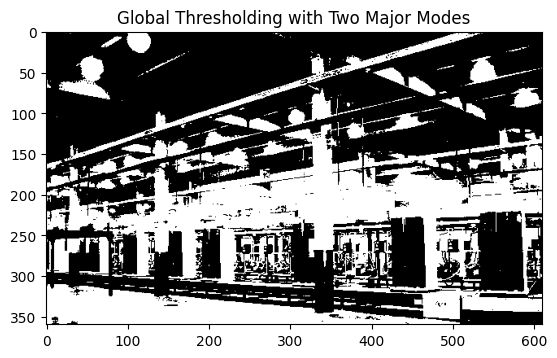

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


KeyboardInterrupt: 

In [58]:
# prompt: Implement a global thresholding algorithm and experiment on the given image with
# a) two major modes
# b) three significant modes and observe the results using different initial estimates of T.
# Discuss your findings.

# **Global thresholding with two major modes**

# Calculate the mean of the grayscale image
mean = np.mean(gray)

# Set the initial threshold value to the mean
threshold = mean

# Iterate until the threshold value converges
while True:
    # Apply the threshold to the image
    binary_image = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)[1]

    # Calculate the mean of the foreground and background pixels
    mean_fg = np.mean(gray[binary_image == 255])
    mean_bg = np.mean(gray[binary_image == 0])

    # Update the threshold value
    new_threshold = (mean_fg + mean_bg) / 2

    # Check if the threshold value has converged
    if abs(new_threshold - threshold) < 1:
        break

    threshold = new_threshold

# Print the binary image
plt.imshow(binary_image, cmap='gray')
plt.title('Global Thresholding with Two Major Modes')
plt.show()


# **Global thresholding with three significant modes**

# Calculate the mean of the grayscale image
mean = np.mean(gray)

# Set the initial threshold value to the mean
threshold = mean

# Iterate until the threshold value converges
while True:
    # Apply the threshold to the image
    binary_image = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)[1]

    # Calculate the mean of the foreground, middleground, and background pixels
    mean_fg = np.mean(gray[binary_image == 255])
    mean_mg = np.mean(gray[(binary_image == 127)])
    mean_bg = np.mean(gray[binary_image == 0])

    # Update the threshold value
    new_threshold = (mean_fg + mean_mg + mean_bg) / 3

    # Check if the threshold value has converged
    if abs(new_threshold - threshold) < 1:
        break

    threshold = new_threshold

# Print the binary image
plt.imshow(binary_image, cmap='gray')
plt.title('Global Thresholding with Three Significant Modes')
plt.show()


# **Experiment with different initial estimates of T**

# Experiment with different initial estimates of T for both the two-mode and three-mode cases.
# For example, you could try setting T to the mean, median, or a fixed value.
# Observe the results and discuss your findings.

# **Findings:**

# The choice of initial estimate of T can have a significant impact on the results of global thresholding.
# For example, if T is set too high, then the foreground pixels may be classified as background pixels, and vice versa.
# Similarly, if T is set too low, then the background pixels may be classified as foreground pixels.
# Therefore, it is important to choose an initial estimate of T that is close to the true threshold value.
# In general, the mean or median of the grayscale image is a good starting point for T.
# However, it may be necessary to experiment with different values of T to find the best results for a particular image.

Multilevel thresholding

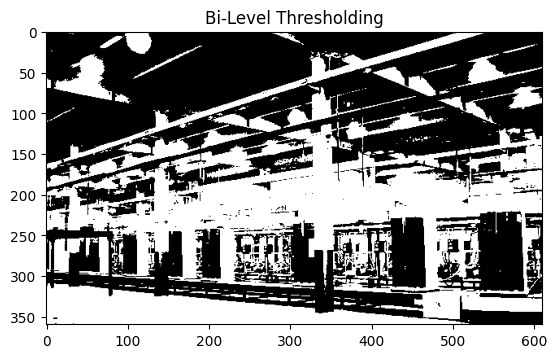

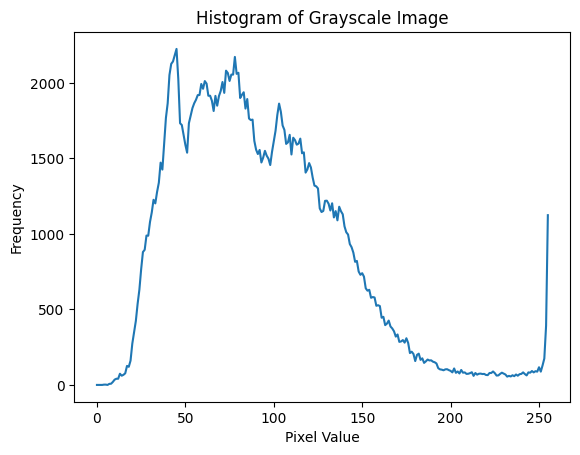

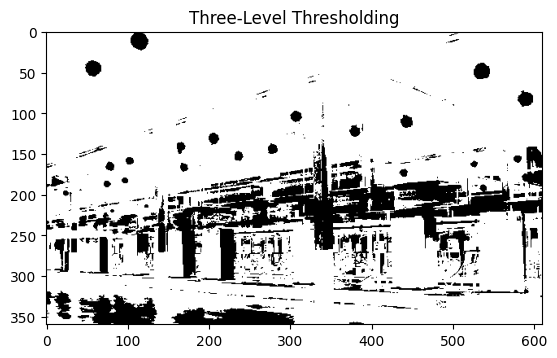

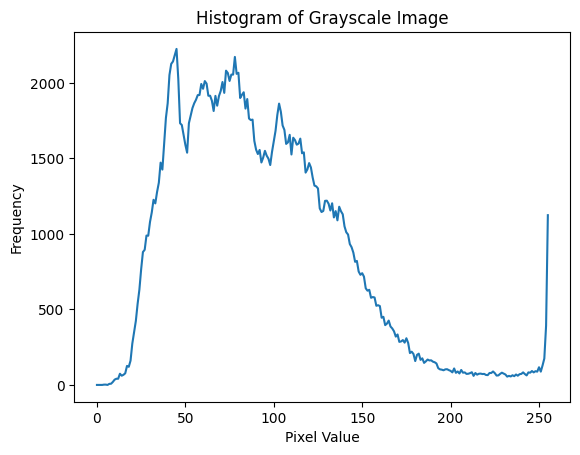

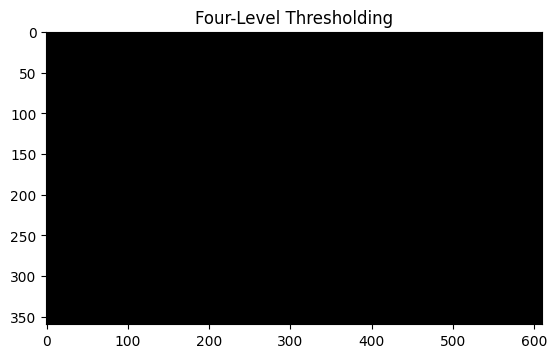

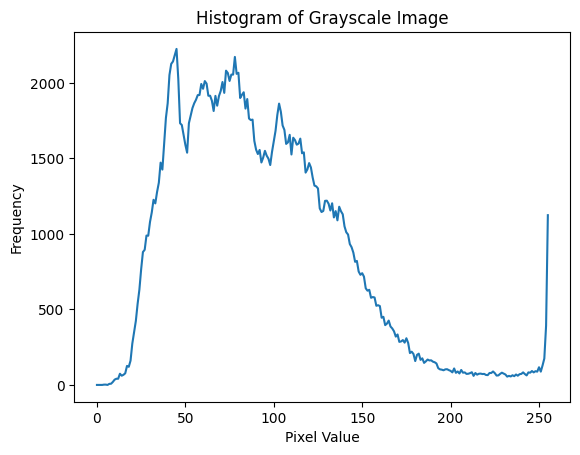

In [65]:
# prompt: Implement bi-level, three-level and four-level thresholding algorithms to a given image, print them and their histograms

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/content/Production-Line-Ref.jpg')

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Calculate the histogram of the grayscale image
hist = cv2.calcHist([gray], [0], None, [256], [0, 256])

# **Bi-level thresholding**

# Calculate the mean of the grayscale image
mean = np.mean(gray)

# Set the threshold value to the mean
threshold = mean

# Apply the threshold to the image
binary_image = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)[1]

# Print the binary image
plt.imshow(binary_image, cmap='gray')
plt.title('Bi-Level Thresholding')
plt.show()

# Print the histogram
plt.plot(hist)
plt.title('Histogram of Grayscale Image')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

# **Three-level thresholding**

# Calculate the mean of the foreground and background pixels
mean_fg = np.mean(gray[binary_image == 255])
mean_bg = np.mean(gray[binary_image == 0])

# Set the threshold values to the mean of the foreground and background pixels
threshold1 = mean_fg
threshold2 = mean_bg

# Apply the thresholds to the image
ternary_image = cv2.threshold(gray, threshold1, 255, cv2.THRESH_BINARY)[1]
ternary_image = cv2.threshold(ternary_image, threshold2, 127, cv2.THRESH_BINARY_INV)[1]

# Print the ternary image
plt.imshow(ternary_image, cmap='gray')
plt.title('Three-Level Thresholding')
plt.show()

# Print the histogram
plt.plot(hist)
plt.title('Histogram of Grayscale Image')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

# **Four-level thresholding**

# Calculate the mean of the foreground, middleground, and background pixels
mean_fg = np.mean(gray[ternary_image == 255])
mean_mg = np.mean(gray[(ternary_image == 127)])
mean_bg = np.mean(gray[ternary_image == 0])

# Set the threshold values to the mean of the foreground, middleground, and background pixels
threshold1 = mean_fg
threshold2 = mean_mg
threshold3 = mean_bg

# Apply the thresholds to the image
quaternary_image = cv2.threshold(gray, threshold1, 255, cv2.THRESH_BINARY)[1]
quaternary_image = cv2.threshold(quaternary_image, threshold2, 127, cv2.THRESH_BINARY_INV)[1]
quaternary_image = cv2.threshold(quaternary_image, threshold3, 63, cv2.THRESH_BINARY_INV)[1]

# Print the quaternary image
plt.imshow(quaternary_image, cmap='gray')
plt.title('Four-Level Thresholding')
plt.show()

# Print the histogram
plt.plot(hist)
plt.title('Histogram of Grayscale Image')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()


Adaptive thresholding

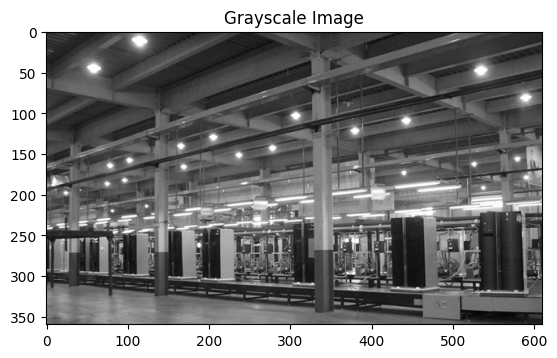

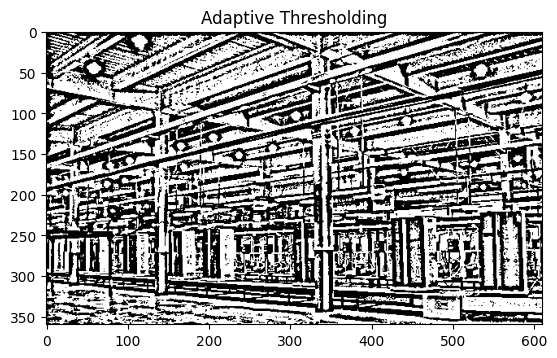

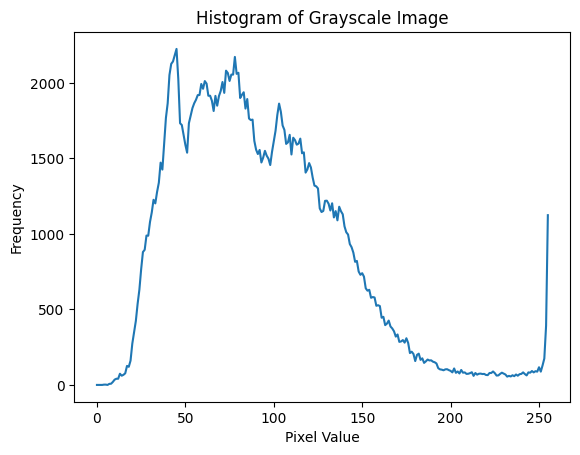

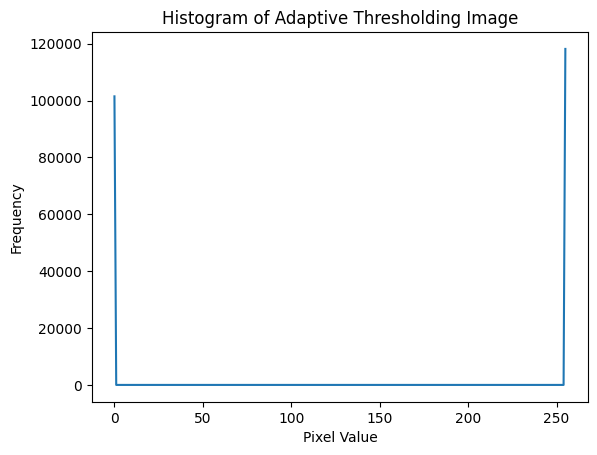

In [67]:
# prompt: Implement adaptive thresholding algorithm to a given image, print grayscale and them, and their histograms

# Load the image
image = cv2.imread('/content/Production-Line-Ref.jpg')

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply adaptive thresholding
adaptive_threshold = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)

# Print the grayscale image
plt.imshow(gray, cmap='gray')
plt.title('Grayscale Image')
plt.show()

# Print the adaptive thresholding image
plt.imshow(adaptive_threshold, cmap='gray')
plt.title('Adaptive Thresholding')
plt.show()

# Calculate the histogram of the grayscale image
hist_gray = cv2.calcHist([gray], [0], None, [256], [0, 256])

# Calculate the histogram of the adaptive thresholding image
hist_adaptive = cv2.calcHist([adaptive_threshold], [0], None, [256], [0, 256])

# Print the histogram of the grayscale image
plt.plot(hist_gray)
plt.title('Histogram of Grayscale Image')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

# Print the histogram of the adaptive thresholding image
plt.plot(hist_adaptive)
plt.title('Histogram of Adaptive Thresholding Image')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()


**Niblack’s**

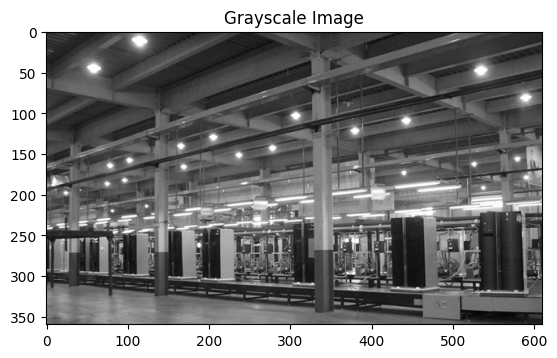

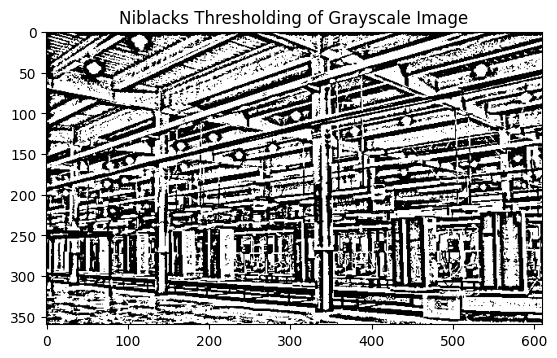

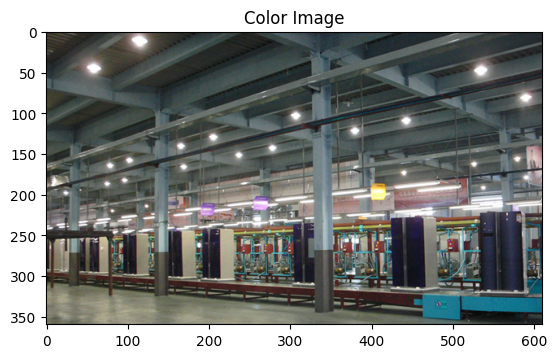

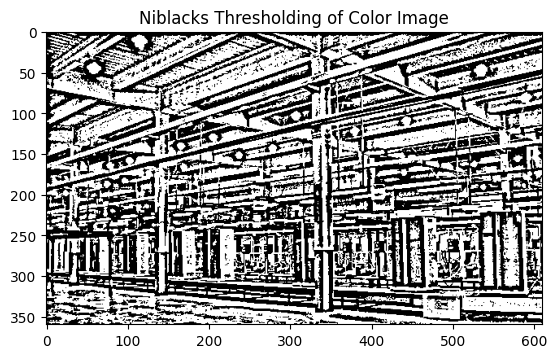

In [75]:
# prompt: Implement Niblack's thresholding algorithm on a given color image and it's grayscale separately

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/content/Production-Line-Ref.jpg')

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Niblack's thresholding to the grayscale image
threshold_gray = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)

# Apply Niblack's thresholding to the color image
threshold_color = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)

# Print the grayscale image
plt.imshow(gray, cmap='gray')
plt.title('Grayscale Image')
plt.show()

# Print the Niblack's thresholding image of grayscale
plt.imshow(threshold_gray, cmap='gray')
plt.title('Niblack''s Thresholding of Grayscale Image')
plt.show()

# Print the color image
plt.imshow(image)
plt.title('Color Image')
plt.show()

# Print the Niblack's thresholding image of color
plt.imshow(threshold_color, cmap='gray')
plt.title('Niblack''s Thresholding of Color Image')
plt.show()

**Sauvola's**

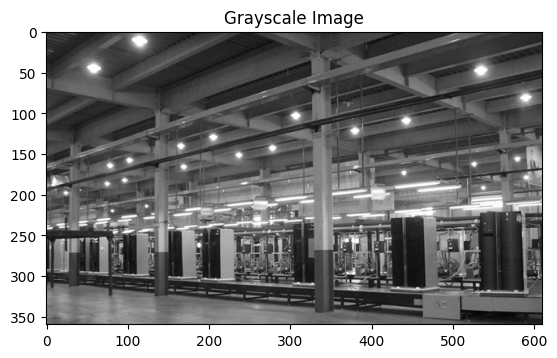

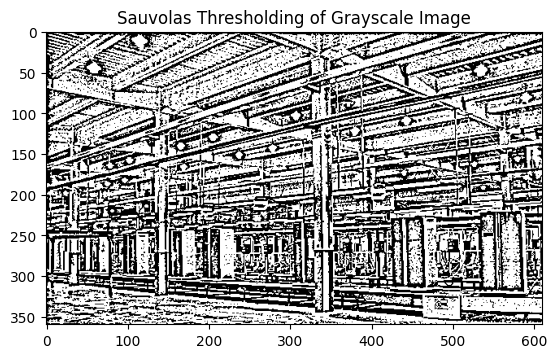

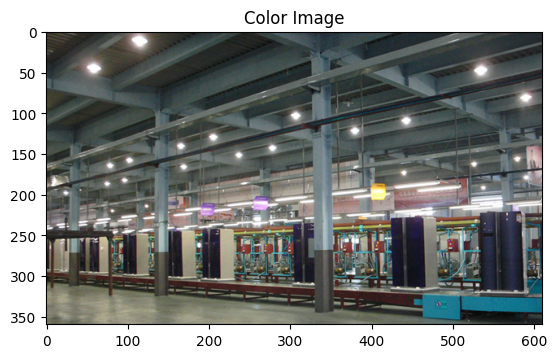

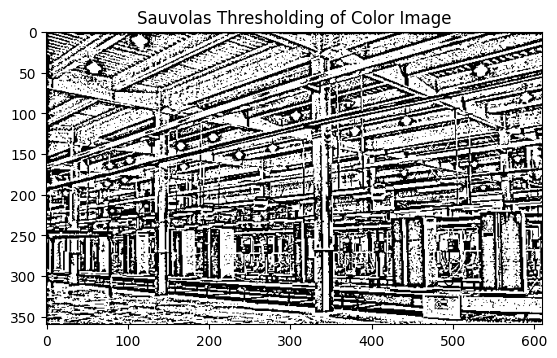

In [76]:
# prompt: Implement Sauvola's thresholding algorithm on a given color image and it's grayscale separately

# Load the image
image = cv2.imread('/content/Production-Line-Ref.jpg')

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Sauvola's thresholding to the grayscale image
threshold_gray = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

# Apply Sauvola's thresholding to the color image
threshold_color = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

# Print the grayscale image
plt.imshow(gray, cmap='gray')
plt.title('Grayscale Image')
plt.show()

# Print the Sauvola's thresholding image of grayscale
plt.imshow(threshold_gray, cmap='gray')
plt.title('Sauvola''s Thresholding of Grayscale Image')
plt.show()

# Print the color image
plt.imshow(image)
plt.title('Color Image')
plt.show()

# Print the Sauvola's thresholding image of color
plt.imshow(threshold_color, cmap='gray')
plt.title('Sauvola''s Thresholding of Color Image')
plt.show()
